# Thinking with Deep Learning: Week 5 Part 1

# Programming LLMs with Language

In Week 4, we saw how we can use the semantic information in large language models (LLMs) through standard nlp pipelines (e.g., classification) or using their underlying embeddings. But LLMs are *natively* programmed through language. Moreover, recent scholarship has both [**argued**](https://aclanthology.org/2023.findings-acl.247/) and then [**demonstrated**](https://proceedings.mlr.press/v202/von-oswald23a.html) how LLMs perform gradient descent on their internal, high-dimensional representations to optimize a response to a language prompt.

In this notebook accompanying the chapter on programming LLMs with language, we will explore various ways we can interact with some of the most powerful deep learning models today using language.

## The landscape of large language models

Since 2023, the deep learning (and especially transformer) paradigm has made massive progress in enabling users to program LLMs with language. As these models begin to flood the mainstream, and with even widely viewed TikTok videos on how to "engineer" prompts, advanced Transformer based models such as GPT-4 and Gemini are accessible to more people than deep learning ever was before.

The most popular of these models today is ChatGPT's family of models, run by OpenAI. There are, however, many other LLMs out there - Google's BARD, Anthropic's Claude, Deep Mind's Gemini, and Meta's open source LLaMa. Moreover, given how fast moving the field has become, ideally, we would prefer to approach this in a program agnostic way, and would point you towards [**LangChain**](https://www.langchain.com/).

The most straightforward way to interact with these models is via their chat based API. To get an idea of how these models do, it's worth jumping onto any of their websites and give them a spin. This is the link to ChatGPT: https://chat.openai.com/. Chat-GPT 3.5 is currently free to use and Chat-GPT-4 can be used with subscription.

While it is impressive - and can improve one's day to day work with respect to coding tasks or information retreival - simple back and forth chat with the model, without stewarding or persisting the interactive content, limits its utility for performing large scale data science, experiments, and analysis.

Such a setup would require an API, where we can pass arguments and text in a controlled environment, automate certain classes of queries, and collect responses for further processing.

In this code, that is what we will do - using a variety of APIs to interact with instances of large language models on a server. This notebook will walk you through various ways you can do that.

The natural alternative is to have a local LLM, but for the kind of LLMs that can effectively be used as a conversational agent (or research assistant!), you would need a LOT of RAM and hardware capacity. We will not assume local hosting in this tutorial, but will have sample code for you to test (outside of Colab, which is not sufficiently large to host a substantial LLM).

<!--## Geneology Diagram / Dialogue Prompt Screenshots-->

## Some links and useful LLMs

Keeping up with the latest LLMs at the top of the pack can be challenging given how quick the field is moving. Academic and production-oriented LLMs also develop at different paces and in different ways. At the moment, there is an active conversation and discussion on LLMs/AI on X/twitter, which is the primary place to really keep ahead of the game - as well as keeping up with Arxiv, and maybe subscribing to a few lists such as the Stanford HAI newsletter (or for more of AI/LLMs and Society view, DAIR).

There are, however, a few "usual suspects" to track for new developments:

[OpenAI](openai.com)

OpenAI offers a variety of different LLMs and APIs addressing different use-cases, including fine-tuning models on your own data. Serious commercial use should be via the APIs, which are currently available by invitation.

[Meta AI LLaMA 2](github.com/facebookresearch/llama/blob/main/MODEL_CARD.md)
A collection of related LLMs released by Meta AI (Facebook). Unlike version 1, version 2 is available for commerical and research purposes.

[Google Bard](bard.google.com)
Google’s experimental LLM. No public APIs available yet, and chatbot conversations are used for further training, so not yet ready for commercial use.

[Amazon AlexaTM](github.com/amazon-science/alexa-teacher-models)
Amazon Science’s LLM, which can be accessed for non-commercial use via AWS SageMaker.

[Anthropic Claude](claude.ai)
Unique model because of its large context window (200k+ tokens or 350 pages), allowing it to answer questions about very long documents. A chat interface is generally available, but conversations may be used for further training, so not a commercial option.

[Hugging Face](huggingface.co)
Hugging Face provides infrastructure support for LLM and other Machine Learning operations, including hosting, training and deployment of models. They also host some internally developed and open-source models such as BLOOM.

Source for links and text - https://www.enthought.com/resource/cheat-sheet-large-language-models-for-scientific-research/



## So where do we start?

We're going to start with Open AI's LLM offering, the ChatGPT family of conversational and text generation models. Why ChatGPT? It was the language models to really kick off LLMs being accessed at the scale it is today--with 100 million users within 2 months--and has often led the leaderboards for multiple language and cognitive tasks, as well as being used by plenty of computational scientists, social scientists, and humanists for their studies.

A caveat of using open AI is that their models are closed, meaning we have to interact via their API only,  that it can be expensive for multiple queries, and that free access is limited to their older models. That being said, given how popular ChatGPT is today, it is worth knowing your way around it - and after having gotten a hand of it, you will find that most other LLMs work in similar ways.

# OpenAI API

The OpenAI API is fairly straightforward, with two primary API modes - chat, and completion. We will start with a straightforward exposition of both methods, before moving on to providing distinctive roles and prompts, along with some best practices.



## Setting your API Key

To use the Open AI API, you first need an API key (https://platform.openai.com/api-keys). This means you need to make an account on the openAI website. Once you've done that, you would want to store this key in your environment variables, so that it isn't leaked.

Follow this link on [best practices for API key safety](https://help.openai.com/en/articles/5112595-best-practices-for-api-key-safety), which will help you keep those issues sorted.

Once you've setup an account and stored your API key securely, the first cell will help you get your environment ready to start using openAI models.

NOTE: LLM frameworks and packages keep changing. This notebook was written with version 1.11.0. Using a different version will likely break things.

This is not code for you to copy paste into projects - it is to walk you through how these tools work, and then adapt accordingly for your own use cases.

In [1]:
!pip install openai==1.11.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 226.0/226.0 kB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 9.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 8.0 MB/s eta 0:00:00


In [2]:
import os
import openai

A note here - if you are working locally, use the code below to grab your API key. If not, the cell after this allows you to enter your key in the notebook in a way where it is not persisted when you save the notebook. If nothing else works...copy and paste your key into the notebook, but make sure not to share it!

In [ ]:
openai.api_key = os.environ["OPENAI_API_KEY"] # Not working if you're using Colab

If you're using Colab, the code below lets you enter it in the notebook.

In [3]:
import getpass
OPENAI_API_KEY = getpass.getpass()

··········


In [4]:
openai.api_key = OPENAI_API_KEY

## Interacting with the model

In this section we will learn how to interact with the GPT models by OpenAI. Since July 2023, OpenAI have updated their API to focus on their "Chat Completions" API, as opposed to just completing a text input (also a sign of how far we've come with language models)!.

What is going on here with these kinds of models? They are state-less, memory-less, generative language models that have been trained with unsupervised learning, supervised learning, and potentially reinforcement learning with human feedback - meaning that they not only have the raw knowledge, but also the ability to recall and manipulate that knowledge into a form useful for us.

When we're chatting with the model on the OpenAI webpage's API, what's happening is that they are using a version of the API underneath it. They are setting a context to the model (which comes through the "system" content), retreiving a response, and sending it back to us. It appears that the model has a working memory of the conversation - but in fact, every new message we type, has the previous chat appended to it as context, and then sent back.

So what we will do now is see how this looks like internally, with the code below. We are using GPT-3.5  (the first Chat-GPT)because it is cheaper - but feel free to go all in and grab GPT-4, a superior model (but note that it will add up!)

Our first step is to setup messages - which involve a dictionary that sets up a role and content. We will see a very simple use case here.

In [5]:
from openai import OpenAI
client = OpenAI(
    api_key=openai.api_key,
)

In [7]:
messages = [{"role": "user", "content": "What are some things that go well with toast in the morning?"}]

In [8]:
response =  client.chat.completions.create(model="gpt-3.5-turbo", messages=messages)

That bit of code would take a few seconds (or more depending on server time), but you would then have your responses. Note that we used the most simple version in this bit of code. We will expand on the selection of other hyperparameters in code to come. Before that, let's have a look at the object returned.

In [9]:
response

ChatCompletion(id='chatcmpl-9EC2ySblTXA5UTgVJSp8IrW3jdwNz', choices=[Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content='1. Butter and jam\n2. Peanut butter and banana slices\n3. Avocado and tomato\n4. Scrambled eggs and cheese\n5. Smoked salmon and cream cheese\n6. Bacon and fried eggs\n7. Nutella and sliced strawberries\n8. Cottage cheese and fresh fruit\n9. Ham and melted cheese\n10. Hummus and cucumber slices', role='assistant', function_call=None, tool_calls=None))], created=1713169928, model='gpt-3.5-turbo-0125', object='chat.completion', system_fingerprint='fp_c2295e73ad', usage=CompletionUsage(completion_tokens=76, prompt_tokens=20, total_tokens=96))

So we see an ID, the object, model information, and then maybe what we are most interested in - the response, under "choices". We also see some usage statistics on how many tokens were used. Let's look at the response more closely.

In [10]:
response.choices[0]

Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content='1. Butter and jam\n2. Peanut butter and banana slices\n3. Avocado and tomato\n4. Scrambled eggs and cheese\n5. Smoked salmon and cream cheese\n6. Bacon and fried eggs\n7. Nutella and sliced strawberries\n8. Cottage cheese and fresh fruit\n9. Ham and melted cheese\n10. Hummus and cucumber slices', role='assistant', function_call=None, tool_calls=None))

So we see a role (the model, assistant) and content.

In [11]:
response.choices[0].message.content

'1. Butter and jam\n2. Peanut butter and banana slices\n3. Avocado and tomato\n4. Scrambled eggs and cheese\n5. Smoked salmon and cream cheese\n6. Bacon and fried eggs\n7. Nutella and sliced strawberries\n8. Cottage cheese and fresh fruit\n9. Ham and melted cheese\n10. Hummus and cucumber slices'

Great - we see a coherent and high quality response for what to eat with toast! So now, what if this is a regular task we wish to perform -- ask ChatGPT about food suggestions -- but we are vegetarian, and want the model to remember that as we move forward?

And what if we like our food suggestion bots to talk only like a charicatured pirate?

Both (and more) are possible, and we will see how to do this in the coming section.

## Programming your model - personalities and prompts

We mentioned how a core aspect of how these models effectively work as chat bots is the ability to append a "context" embedding. For example, if you are using the OpenAI GUI, you have the option to "let the model know anything about you", as well as give instructions on how you want the model to respond. What is likely happening under the hood is a way of passing this on as an embedding to the model, which is itself often further tuned with RLHF (Reinforcement Learning with Human Feedback) to parse the context embedding sufficiently well to keep it in mind for the response.

As we will see in later notebook examples in this notebook, it is possible to use the API to tap into this functionality - and effectively be able to program a "personality" into your model, or give it vital context to remember when responding to you. We illustrate this quite simply with our same breakfast model, this time reminding it that you are vegetarian.

In [12]:
messages = [{"role": "system", "content": "You are my breakfast assistant. Don't forget that I am a vegetarian."},
            {"role": "user", "content": "What are some things that go well with toast in the morning?"}]
response = openai.chat.completions.create(model="gpt-3.5-turbo", messages=messages)

In [13]:
response.choices[0].message.content

'There are plenty of vegetarian options that you can enjoy with toast in the morning. Here are a few ideas:\n\n1. Avocado toast with a sprinkle of salt, black pepper, and red pepper flakes\n2. Peanut butter and banana slices on toast\n3. Scrambled tofu with spinach and cherry tomatoes on toast\n4. Hummus and sliced cucumber on toast\n5. Almond butter and sliced strawberries on toast\n\nThese are just a few suggestions to get you started. Feel free to get creative and experiment with different toppings to find your favorite combination!'

Great! Now as long as we need food advice, as long as throw in the "system" role to remember your preferences, it will take that into account. In practice it is appending the embedding of the context message to the first pass you send over.

This is one style of doing "personalities" with prompts. The other is to merely add text before your message begins to align the model to the results you require. Different models will respond differently to prompts. Here is an article from OpenAI on best practices for prompt engineering for its models.

https://help.openai.com/en/articles/6654000-best-practices-for-prompt-engineering-with-openai-api

# Fine Tuning a local model - LLaMa 2

We would want to provide you with an example of fine-tuning an LLM, but thist task can be computationally expensive, and so we will use the LoRA (a low-rank adaptation) copy of Stanford's Alpaca, a slimmed down fork of LLaMa2, for tuning: https://github.com/TianyiPeng/Colab_for_Alpaca_Lora

Note: In order to run the llama2-7b version, use A100 (on Colab) or better. Consider that A100 costs 13.08 computing units per hour, which is expensive. Take that in mind!

In [14]:
%%capture
%pip install accelerate peft bitsandbytes transformers trl

In [15]:

import os
import torch
from datasets import load_dataset
from transformers import (
    AutoModelForCausalLM,
    AutoTokenizer,
    BitsAndBytesConfig,
    HfArgumentParser,
    TrainingArguments,
    pipeline,
    logging,
)
from peft import LoraConfig, PeftModel
from trl import SFTTrainer

## Model Config

In [16]:
# Model from Hugging Face hub
base_model = "NousResearch/Llama-2-7b-chat-hf"

# New instruction dataset
guanaco_dataset = "mlabonne/guanaco-llama2-1k"

# Fine-tuned model
new_model = "llama-2-7b-chat-guanaco"

Now let's select the dataset with which to fine-tune the model.

In [17]:
dataset = load_dataset(guanaco_dataset, split="train")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Generating train split:   0%|          | 0/1000 [00:00<?, ? examples/s]

Note that dataset is a special class created by HuggingFace for interaciting models on there with their APIs. It looks like python's built-in list and dictionary and but is slightly different.

In [18]:
dataset

Dataset({
    features: ['text'],
    num_rows: 1000
})

In [19]:
dataset.features

{'text': Value(dtype='string', id=None)}

In this dataset, there is a question [INST]/[/INST] followed by an answer. Alternatively, you could simply include text, as describe in the HuggingFace link below.

In [20]:
dataset[0]

{'text': '<s>[INST] Me gradué hace poco de la carrera de medicina ¿Me podrías aconsejar para conseguir rápidamente un puesto de trabajo? [/INST] Esto vale tanto para médicos como para cualquier otra profesión tras finalizar los estudios aniversarios y mi consejo sería preguntar a cuántas personas haya conocido mejor. En este caso, mi primera opción sería hablar con otros profesionales médicos, echar currículos en hospitales y cualquier centro de salud. En paralelo, trabajaría por mejorar mi marca personal como médico mediante un blog o formas digitales de comunicación como los vídeos. Y, para mejorar las posibilidades de encontrar trabajo, también participaría en congresos y encuentros para conseguir más contactos. Y, además de todo lo anterior, seguiría estudiando para presentarme a las oposiciones y ejercer la medicina en el sector público de mi país. </s>'}

**Many of you may want to construct a dataset class instance using your local dataset: refer to [this](https://huggingface.co/docs/datasets/en/create_dataset)**

In [21]:
compute_dtype = getattr(torch, "float16")

quant_config = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_quant_type="nf4",
    bnb_4bit_compute_dtype=compute_dtype,
    bnb_4bit_use_double_quant=False,
)

In [22]:
# Load base model
model = AutoModelForCausalLM.from_pretrained(
    base_model,
    quantization_config=quant_config,
    device_map={"": 0}
)
model.config.use_cache = False
model.config.pretraining_tp = 1

config.json:   0%|          | 0.00/583 [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/26.8k [00:00<?, ?B/s]

model-00001-of-00002.safetensors:   0%|          | 0.00/9.98G [00:00<?, ?B/s]

model-00002-of-00002.safetensors:   0%|          | 0.00/3.50G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/179 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/generation/configuration_utils.py:410: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`. This was detected when initializing the generation config instance, which means the corresponding file may hold incorrect parameterization and should be fixed.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/configuration_utils.py:415: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.6` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`. This was detected when initializing the generation config instance, which means the corresponding file may hold incorrect parameterization and should be fixed.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/configuratio

In [23]:
# Load LLaMA tokenizer
tokenizer = AutoTokenizer.from_pretrained(base_model, trust_remote_code=True)
tokenizer.pad_token = tokenizer.eos_token
tokenizer.padding_side = "right"

tokenizer_config.json:   0%|          | 0.00/746 [00:00<?, ?B/s]

tokenizer.model:   0%|          | 0.00/500k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.84M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/21.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/435 [00:00<?, ?B/s]

In [24]:
# Load LoRA configuration
peft_args = LoraConfig(
    lora_alpha=16,
    lora_dropout=0.1,
    r=32, # the rank of the adaptation
    bias="none",
    task_type="CAUSAL_LM",
)

In [25]:
# Set training parameters
training_params = TrainingArguments(
    output_dir="./results",
    num_train_epochs=1,
    per_device_train_batch_size=2,
    gradient_accumulation_steps=1,
    optim="paged_adamw_32bit",
    save_steps=25,
    logging_steps=25,
    learning_rate=2e-4,
    weight_decay=0.001,
    fp16=True, # speed up
    bf16=False,
    max_grad_norm=0.3,
    max_steps=-1,
    warmup_ratio=0.03,
    group_by_length=True,
    lr_scheduler_type="constant",
    report_to="tensorboard"
)

In [26]:
# Set supervised fine-tuning parameters
trainer = SFTTrainer(
    model=model,
    train_dataset=dataset,
    peft_config=peft_args,
    dataset_text_field="text",
    max_seq_length=None,
    tokenizer=tokenizer,
    args=training_params,
    packing=False,
)

/usr/local/lib/python3.10/dist-packages/trl/trainer/sft_trainer.py:246: UserWarning: You didn't pass a `max_seq_length` argument to the SFTTrainer, this will default to 1024
  warnings.warn(


Map:   0%|          | 0/1000 [00:00<?, ? examples/s]

/usr/local/lib/python3.10/dist-packages/accelerate/accelerator.py:436: FutureWarning: Passing the following arguments to `Accelerator` is deprecated and will be removed in version 1.0 of Accelerate: dict_keys(['dispatch_batches', 'split_batches', 'even_batches', 'use_seedable_sampler']). Please pass an `accelerate.DataLoaderConfiguration` instead: 
dataloader_config = DataLoaderConfiguration(dispatch_batches=None, split_batches=False, even_batches=True, use_seedable_sampler=True)
  warnings.warn(


In [27]:
# Train model
trainer.train()

Step,Training Loss
25,1.369800
50,1.677200
75,1.168800
100,1.493900
125,1.055600
150,1.487800
175,1.315800
200,1.359700
225,1.160800
250,1.293200


TrainOutput(global_step=500, training_loss=1.3253060646057129, metrics={'train_runtime': 207.6482, 'train_samples_per_second': 4.816, 'train_steps_per_second': 2.408, 'total_flos': 1.6955417639387136e+16, 'train_loss': 1.3253060646057129, 'epoch': 1.0})

In [28]:
# Save trained model
trainer.model.save_pretrained(new_model)

In [29]:
# save tokenizer
trainer.tokenizer.save_pretrained(new_model)

('llama-2-7b-chat-guanaco/tokenizer_config.json',
 'llama-2-7b-chat-guanaco/special_tokens_map.json',
 'llama-2-7b-chat-guanaco/tokenizer.model',
 'llama-2-7b-chat-guanaco/added_tokens.json',
 'llama-2-7b-chat-guanaco/tokenizer.json')

In [30]:
pwd

'/content'

In [31]:
ls

llama-2-7b-chat-guanaco/  results/  sample_data/


In [32]:
!kill 26235

/bin/bash: line 1: kill: (26235) - No such process


In [33]:
from tensorboard import notebook
log_dir = "results/runs"
notebook.start("--logdir {} --port 4000".format(log_dir))

<IPython.core.display.Javascript object>

In [34]:
from transformers import AutoModelForCausalLM, AutoTokenizer, TextGenerationPipeline

# Ignore warnings
logging.set_verbosity(logging.CRITICAL)

# Assuming 'new_model' is defined and contains the name of your model directory
model_path = f'/content/{new_model}'

# Load the model and tokenizer directly
model = AutoModelForCausalLM.from_pretrained(model_path)
tokenizer = AutoTokenizer.from_pretrained(model_path)

# Create the text generation pipeline manually
pipe = TextGenerationPipeline(model=model, tokenizer=tokenizer, task="text-generation", max_length=200)

# Run text generation
prompt = "Who is Leonardo Da Vinci?"
result = pipe(f"<s>[INST] {prompt} [/INST]")
print(result[0]['generated_text'])


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/generation/configuration_utils.py:410: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`. This was detected when initializing the generation config instance, which means the corresponding file may hold incorrect parameterization and should be fixed.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/configuration_utils.py:415: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.6` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`. This was detected when initializing the generation config instance, which means the corresponding file may hold incorrect parameterization and should be fixed.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/configuratio

<s>[INST] Who is Leonardo Da Vinci? [/INST] Leonardo da Vinci (1452-1519) was an Italian polymath, artist, inventor, and scientist. He is widely considered to be one of the greatest painters of all time, and his inventions and designs were centuries ahead of his time.

Da Vinci was born in the town of Vinci, near Florence, Italy. He was the illegitimate son of a local notary, and his mother was a peasant. Despite his humble origins, da Vinci was recognized as a prodigy from an early age, and he was apprenticed to the artist Andrea del Verrocchio in Florence.

Da Vinci's most famous works include the Mona Lisa, The Last Supper, and Vitruvian Man. He is also known for his inventions and designs, including flying machines,


In [35]:
prompt = "What is Datacamp Career track?"
result = pipe(f"<s>[INST] {prompt} [/INST]")
print(result[0]['generated_text'])

<s>[INST] What is Datacamp Career track? [/INST] DataCamp Career Track is a professional development program designed to help data scientists and engineers advance their careers. The program provides a comprehensive curriculum, mentorship, and networking opportunities to help participants build their skills and achieve their career goals.

The program is divided into three tracks:

1. Data Science Fundamentals: This track covers the basics of data science, including data visualization, statistical analysis, and machine learning.
2. Data Engineering: This track focuses on the technical skills required to build and maintain data pipelines, including data warehousing, data governance, and data architecture.
3. Data Science and Engineering in Practice: This track provides real-world examples of data science and engineering in action, including case studies, projects, and industry insights.

The program also includes a capstone project, which allows


Looks great! If you'd like to push your fine-tuned model to Huggingface:

In [36]:
!huggingface-cli login


    _|    _|  _|    _|    _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|_|_|_|    _|_|      _|_|_|  _|_|_|_|
    _|    _|  _|    _|  _|        _|          _|    _|_|    _|  _|            _|        _|    _|  _|        _|
    _|_|_|_|  _|    _|  _|  _|_|  _|  _|_|    _|    _|  _|  _|  _|  _|_|      _|_|_|    _|_|_|_|  _|        _|_|_|
    _|    _|  _|    _|  _|    _|  _|    _|    _|    _|    _|_|  _|    _|      _|        _|    _|  _|        _|
    _|    _|    _|_|      _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|        _|    _|    _|_|_|  _|_|_|_|

    To login, `huggingface_hub` requires a token generated from https://huggingface.co/settings/tokens .
Token: Traceback (most recent call last):

^C


In [37]:
# Reload model in FP16 and merge it with LoRA weights
load_model = AutoModelForCausalLM.from_pretrained(
    base_model,
    low_cpu_mem_usage=True,
    return_dict=True,
    torch_dtype=torch.float16,
    device_map={"": 0},
)

model = PeftModel.from_pretrained(load_model, new_model)
model = model.merge_and_unload()

# Reload tokenizer to save it
tokenizer = AutoTokenizer.from_pretrained(base_model, trust_remote_code=True)
tokenizer.add_special_tokens({'pad_token': '[PAD]'})
tokenizer.pad_token = tokenizer.eos_token
tokenizer.padding_side = "right"

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

In [ ]:
model.push_to_hub(new_model, use_temp_dir=False)
tokenizer.push_to_hub(new_model, use_temp_dir=False)

# Reinforcement Learning with Human Feedback (RLHF)
Open AI introduced RLHF as an approach to tuning their GPT model class through multiple generative responses, and the request the users provide minimal feedback (e.g. “thumbs up”, “thumbs down”) to express their evaluation of the generated text. While Open AI did not describe how they implement RLHF in detail, a number of open source approaches are emerging. We do not provide a specific example here, but point to a [popular repository](https://github.com/opendilab/awesome-RLHF) tracking such open RLHF theory and code developments.  


# LLMs and Annotating Texts

We will be using code from this tutorial to illustrate how LLMs can be used in action:

https://github.com/vminvsky/css-llm-tutorial.

## NOTE

You're going to have to upload the data and requirements to make sure that this sectoin works correctly.

In this section, we will see how LLMs can be used to annotate and generate data for studying linguistic constructs.

Our goals are as follows:

* **Goal 1:** Learn langchain.
    * Langchain is the most common library for interacting with LLMs in Python!

* **Goal 2:** Annotate a dataset with ChatGPT
    * Annotate texts as being sarcastic or not using ChatGPT.

* **Goal 3:** Generate Synthetic Data for a Specific Construct of Interest
    * Generate new examples of sarcastic and non-sarcastic texts.
    
A few requirements.
1. You will need an OpenAI key to generate the data. Because the data has already been generated, you won't need it to explore the synthetic data, but if you want to re-run the generation you will need to obtain a key. You can signup [here](https://openai.com/blog/openai-api)
2. *(If you have an API key)* In the .env file in root add your API key.
3. Run the requirements.txt file to pip install all the necessary libraries.
4. Visit the GitHub link and grab all the data and re

#### Local Setup
Let's install all the required libraries to go through this document.

requirements - NOTE - this code will only work with older versions of openai and langchain.

pandas

langchain==0.0.205

numpy==1.22.4

scipy==1.10.1

python-dotenv

openai==0.27.8

In [39]:
# requirements = "/content/requirements.txt"
# !pip install -r {requirements}

In [40]:
pip install langchain==0.0.205

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.0/90.0 kB 14.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 23.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.4/49.4 kB 7.4 MB/s eta 0:00:00
  Attempting uninstall: pydantic
    Found existing installation: pydantic 2.6.4
    Uninstalling pydantic-2.6.4:
      Successfully uninstalled pydantic-2.6.4


In [41]:
pip install python-dotenv

In [42]:
pip install openai==0.27.8

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.6/73.6 kB 2.8 MB/s eta 0:00:00
  Attempting uninstall: openai
    Found existing installation: openai 1.11.0
    Uninstalling openai-1.11.0:
      Successfully uninstalled openai-1.11.0


In [1]:
import pandas as pd
import openai
import langchain
from dotenv import load_dotenv
import os
from tqdm import tqdm

from langchain import LLMChain
from langchain.chat_models import ChatOpenAI

from langchain.prompts import (
    ChatPromptTemplate,
    PromptTemplate,
    SystemMessagePromptTemplate,
    AIMessagePromptTemplate,
    HumanMessagePromptTemplate,
)

load_dotenv()  # take environment variables from .env.

False

Run this cell to load the autoreload extension. This allows us to edit .py source files, and re-import them into the notebook for a seamless editing and debugging experience.

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
seed = 42    # for reproducibility

In [4]:
# OPENAI_API_KEY = os.getenv("OPENAI_API_KEY")
OPENAI_API_KEY = "your key"

Or if you don't want to keep it in your notebook for safety concerns:

In [5]:
import getpass
OPENAI_API_KEY = getpass.getpass()

··········


In [6]:
openai.api_key = OPENAI_API_KEY

### 1. Dataset Introduction

The dataset includes two columns: `text` and `labels`. Where `text` is a Tweet and `label` is either sarcastic or non-sarcastic.

In [7]:
def example_rows(df):
    print("Example of a sarcastic text")
    print(df[df["labels"]=="sarcastic"].iloc[0]["text"])
    print()
    print("Example of a non-sarcastic text")
    print(df[df["labels"]=="not-sarcastic"].iloc[0]["text"])

In [9]:
df = pd.read_json("./data/llm_data/sarcasm.json", orient="records")

In [10]:
print("Number of rows: ",len(df))
print("Number of sarcastic comments: ",len(df[df["labels"]=="sarcastic"]))
print()
example_rows(df)


Number of rows:  500
Number of sarcastic comments:  135

Example of a sarcastic text
do people with clear skin feel accomplished?? superior??? comfortable in their own skin???? whats that like lmfao

Example of a non-sarcastic text
A message to all Muslims and Refugees: I'm sorry for how my country is treating you. You are only human. #RefugeesDetained #Trump #rt


### 2. Langchain
> [LangChain](https://python.langchain.com/docs/get_started/quickstart) is a framework for developing applications powered by language models.

We will use Langchain to *annotate* and *generate* sarcastic texts! Langchain is currently the most widely used Python library for interacting with LLMs programatically. It contains a lot of useful functionalities, but we will focuse on the simple case: given a prompt, generate text!

To design prompts we need to add both a `system` prompt and a `message` prompt. In Langchain this corresponds to `HumanMessagePromptTemplate` and `SytemMessagePromptTemplate`. To read more about prompt templates you can look at the Langchain documentation [here](https://python.langchain.com/docs/modules/model_io/prompts/prompt_templates/).

All prompts are included in the `utils.py` file but we will add an example below.

The **system** message basically puts the model into a certain headspace through meta-instructions. E.g., "You are a helpful assistant!".

The **human message** instead includes the task explanation.

In this code, we ask the model to generate `{num_generations}` (for example 10) `{direction}` (for example sarcastic) comments.

The function will then return a list with the two messages which we will feed into Langchain's LLM. :)


```py
def sarcasm_simple_prompt(self) -> list:
    system_message = SystemMessagePromptTemplate(
        prompt=PromptTemplate(
            input_variables=[],
            template="You are a model that generates sarcastic and non-sarcastic texts."
        )
    )
    human_message = HumanMessagePromptTemplate(
        prompt=PromptTemplate(
            input_variables=["num_generations", "direction"],
            template="Generate {num_generations} {direction} texts. Ensure diversity in the generated texts."
        )
    )
    return [system_message, human_message]
```
See [here](https://github.com/vminvsky/css-llm-tutorial/blob/main/utils.py) for more exaples.



### 2.1 Annotations
Let's annotate texts as being sarcastic or not, and report the performance!

First, let's try it on one text:
> do people with clear skin feel accomplished?? superior??? comfortable in their own skin???? whats that like lmfao

*Only run the code if you have an OpenAI key, otherwise just import the files with already generated data.*

In [11]:
def sarcasm_annotate_prompt() -> list:
    system_message = SystemMessagePromptTemplate(
        prompt=PromptTemplate(
            input_variables=[],
            template="You are a model that annotates sarcastic and non-sarcastic texts."
        )
    )
    human_message = HumanMessagePromptTemplate(
        prompt=PromptTemplate(
            input_variables=["text"],
            template="""Classify the following text as being sarcastic or non-sarcastic. Reply with 'Sarcastic' if it's sarcastic and 'Non-sarcastic' if it's non-sarcastic.
            Text: {text}
            """
        )
    )
    return [system_message, human_message]

In [12]:
example_text = "do people with clear skin feel accomplished?? superior??? comfortable in their own skin???? whats that like lmfao"

In [13]:
llm = ChatOpenAI(model_name="gpt-3.5-turbo", temperature=0.9, openai_api_key=OPENAI_API_KEY)
prompt = ChatPromptTemplate.from_messages(sarcasm_annotate_prompt())
chain = LLMChain(prompt=prompt, llm=llm)
generated = chain.run({"text": example_text})

In [14]:
print(generated)

Sarcastic


Great! It seems to work. Now we will iterate through all the sarcastic texts in our document.

Let's see how sarcastic/nonsarcastic examples look like:

In [15]:
generated = []
prompt = ChatPromptTemplate.from_messages(sarcasm_annotate_prompt())
chain = LLMChain(prompt=prompt, llm=llm)
for i, row in tqdm(df.iterrows(), total=len(df)):
    text = row["text"]
    generated.append(chain.run({"text": text}))
df["predict"] = generated

100%|██████████| 500/500 [03:15<00:00,  2.56it/s]


In [16]:
df["predict"]

0      Non-sarcastic
1      Non-sarcastic
2      Non-sarcastic
3          Sarcastic
4      Non-sarcastic
           ...      
495        Sarcastic
496    Non-sarcastic
497    Non-sarcastic
498    Non-sarcastic
499    Non-sarcastic
Name: predict, Length: 500, dtype: object

The annotations have already been run, so let's just import the dataset.

In [18]:
df = pd.read_json("./data/llm_data/annotate_gpt-3.5-turbo.json")

In [19]:
def process_text(x):
    """
    Process GPT outputs. Otherwise
    """
    if "non-sarcastic" in x.lower():
        return "not-sarcastic"
    else:
        return "sarcastic"

df["predict"] = df["predict"].apply(lambda x: process_text(x))


Let's import some metrics to see how well the predictions are.

In [20]:
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
accuracy = accuracy_score(df["target"], df["predict"])
precision, recall, f1, _ = precision_recall_fscore_support(df["target"], df["predict"], average="macro")

print(f"Accuracy: {accuracy}")
print(f"F1 score: {round(f1, 3)}")

Accuracy: 0.602
F1 score: 0.596


Not amazing!

Instead, we can try to generate more data.

### 2.2 Generating data
Now we'll quickly go over how to generate more sarcastic texts. This can be used for *de-novo* dataset creation to augment your data.

We'll use a grounded prompting technique, where we'll rewrite real tweets to make them sarcastic or not!

Let's rewrite this Tweet as an example:
> Tapping a tuning fork and seeing who resonates

In [21]:
def sarcasm_grounded_prompt() -> list:
    system_message = SystemMessagePromptTemplate(
        prompt=PromptTemplate(
            input_variables=[],
            template="You are a model that generates sarcastic and non-sarcastic texts."
        )
    )
    human_message = HumanMessagePromptTemplate(
        prompt=PromptTemplate(
            input_variables=["text", "num_generations", "direction"],
            template="""Rewrite the following text {num_generations} times to make it {direction}.
            Make as few changes as possible to the text and stay true to its underlying style.
            Text: {text}
            """
        )
    )
    return [system_message, human_message]

In [22]:
example_text = "Tapping a tuning fork and seeing who resonates"

In [23]:
llm = ChatOpenAI(model_name="gpt-3.5-turbo", temperature=0.9, max_tokens=512, openai_api_key=OPENAI_API_KEY)
prompt = ChatPromptTemplate.from_messages(sarcasm_grounded_prompt())
chain = LLMChain(prompt=prompt, llm=llm)
generated = chain.run({"text": example_text, "direction": "sarcastic", "num_generations": 1})

In [24]:
print(generated)

Oh, because tapping a tuning fork and seeing who resonates is just the most thrilling and productive use of time.


A little on the nose...GPT4 is better (sarcasm is hard)!

Don't run the following code if OpenAI key not connected, just import csv!

In [ ]:
generated = []
for i, row in tqdm(df.iterrows(), total=len(df)):
    for direction in ["sarcastic", "not-sarcastic"]: # choose direction
        text = row["text"]
        prompt = ChatPromptTemplate.from_messages(sarcasm_grounded_prompt())
        chain = LLMChain(prompt=prompt, llm=llm)
        generated.append(chain.run({"text": text, "direction": direction, "num_generations": 1}))

df["augmented_text"] = generated

In [31]:
df = pd.read_json("./data/llm_data/grounded_gpt-3.5-turbo.json")

### Analysis

Let's see if there are ideosyncracies in the generated sarcastic texts!

There is a lot that can be done here, but we will look at the prevelance of "Oh" in sarcastic comments between the two groups.

In [32]:
generated_sarcastic = df[df["labels"]=="sarcastic"]["augmented_text"].values
original_sarcastic = df[df["target"]=="sarcastic"].drop_duplicates(subset="text")["text"].values

In [33]:
oh_synthetic = len([k for k in generated_sarcastic if "oh" in k.lower()]) / len(generated_sarcastic)
oh_real = len([k for k in original_sarcastic if "oh" in k.lower()]) / len(original_sarcastic)

print(f"'Oh' present in {round(oh_synthetic, 3)} of synthetic texts")
print()
print(f"'Oh' present in {round(oh_real, 3)} of real texts")

'Oh' present in 0.165 of synthetic texts

'Oh' present in 0.022 of real texts


# How to program with language?

## 0-Shot

Zero-shot learning means that you simply give the model a prompt and accept the output. For some tasks, this is sufficient to achieve strong performance. (For many, it is not).

In [34]:
from langchain.llms import OpenAI

# Initialize the OpenAI model
model = OpenAI(model="gpt-3.5-turbo-instruct", openai_api_key=openai.api_key)

# Zero-shot example: Ask a question without giving any examples
question = "What is the impact of quantum computing on cryptography?"
response = model.generate(prompts=[question])
print(response)

generations=[[Generation(text='\n\nQuantum computing has the potential to significantly impact cryptography in both positive and negative ways. Here are some potential impacts:\n\n1. Breaking current encryption methods: Quantum computers have the ability to solve certain mathematical problems, such as factoring large numbers, much faster than classical computers. This means that they could potentially break commonly used encryption methods, such as RSA and elliptic curve cryptography, rendering them useless.\n\n2. Secure communication: On the other hand, quantum computing can also provide a more secure means of communication. Quantum key distribution (QKD) uses the principles of quantum mechanics to generate and distribute encryption keys, making it virtually impossible to intercept or decode the communication. This could greatly enhance the security of sensitive information.\n\n3. Development of new encryption methods: With the potential threat of quantum computers breaking current en

## Few-Shot

Few shot learning means that you provide the model with examples (it could be examples for classification tasks or generative tasks), and often more lengthy instructions to inform it of the character of the desired output.

These can be short, long, or (e.g., with Claude) very long.

In [35]:
from langchain.llms import OpenAI

# Initialize the OpenAI model
model = OpenAI(model="gpt-3.5-turbo-instruct", openai_api_key=openai.api_key)

# Few-shot example with varying lengths
few_shot_prompt = """
[Short Example]
Once upon a time, in a magical forest, a small elf discovered a hidden treasure.

[Long Example]
In a mystical forest, shrouded in mist, lived a wise old tree. For centuries, this tree watched over the forest, its branches stretching high into the sky. One day, a young girl ventured into the forest, drawn by legends of ancient magic. As she approached the tree, it whispered secrets of the forest’s past and revealed to her the path to true wisdom.

[Very Long Example]
Deep in the heart of a lush and enchanted forest, there was a clearing known for its extraordinary beauty. This clearing was home to a variety of magical creatures, each with their own unique abilities. The most remarkable of these creatures was a unicorn with a shimmering, opalescent mane. This unicorn was not only known for its breathtaking appearance but also for its ability to heal any ailment with a single touch of its horn. One evening, as the sun set, casting a golden glow over the clearing, a group of weary travelers stumbled upon this magical place. Amazed by the wonders they saw, they were greeted by the unicorn, which offered them its healing powers. As they spent the night under the stars, the travelers listened to the stories of the forest told by the creatures, each tale more wondrous than the last.

[Your Task]
Write a story about a magical forest that includes a talking animal and a hidden mystery.
"""


In [36]:
# Generate the story
story = model.generate(prompts=[few_shot_prompt])
print(story.generations[0][0].text)


In a far-off land, nestled between the towering mountains and the glistening sea, there lay a mystical forest. It was said that this forest was home to creatures beyond imagination, and that within its depths lay a hidden mystery waiting to be discovered.

One warm summer day, a young girl named Lily ventured into the forest, drawn by its enchanting allure. As she wandered deeper into the trees, she came upon a clearing, where a majestic talking owl perched upon a tree branch. The owl spoke to her in a gentle voice, telling her of the wonders of the forest and the secrets it held.

Intrigued by the owl's words, Lily followed its guidance and soon found herself standing before a large, ancient tree. The tree was unlike any she had ever seen before, with gnarled branches and a trunk covered in intricate carvings. As she reached out to touch the tree, a soft voice whispered in her ear, "Welcome, child. I am the wise old tree, and I have been waiting for you."

Lily was astonished to find

Language Models are known to be few-shot learners. While this paper is not included in the class readings this week, I encourage you to check out this famous paper (20K+ citations! ): [Language Models are Few-Shot Learners](https://proceedings.neurips.cc/paper_files/paper/2020/hash/1457c0d6bfcb4967418bfb8ac142f64a-Abstract.html?utm_medium=email&utm_source=transaction)

## Interactive Multi-shot

With interactive multi-shot examples, you can "talk back" to model generations through iterative suggestions that help the model understand what you want (and why).







In [37]:
# Interactive multi-shot example
context = ""
user_inputs = ["Tell me about black holes.", "Why are they important?", "Can we see them directly?"]

for user_input in user_inputs:
    # Add user input to the context
    context += f"User: {user_input}\nAI:"

    # Generate response
    response = model.generate(prompts=[context])

    # Add response to the context
    context += f" {response}\n"

    print(f"AI: {response}")


AI: generations=[[Generation(text=' Black holes are regions of space where the gravitational pull is so strong that nothing, not even light, can escape from them. They form when a massive star dies and collapses under its own weight. The gravity in these regions is so intense because the mass of the star is concentrated in a very small space. This creates a singularity at the center of the black hole, which is a point of infinite density and zero volume. The boundary of a black hole, called the event horizon, marks the point of no return for anything that gets too close. As a result, black holes are invisible, but their presence can be detected by the effects they have on nearby matter and light. They are some of the most mysterious and fascinating objects in the universe, and scientists are still trying to understand their nature and behavior.', generation_info={'finish_reason': 'stop', 'logprobs': None})]] llm_output={'token_usage': {'completion_tokens': 162, 'total_tokens': 172, 'pr

## Chain of Reasoning

Chain of reasoning (https://arxiv.org/abs/2201.11903) is a novel approach to enhance the reasoning capabilities of large language models (LLMs), especially in multi-step reasoning tasks.

In contrast to the standard prompting, where models are asked to directly produce the final answer, 'Chain of Thought Prompting' encourages LLMs to generate intermediate reasoning steps before providing the final answer to a problem. The advantage of this technique lies in its ability to break down complex problems into manageable, intermediate steps. By doing this, the model-generated 'chain of thought' can mimic an intuitive human thought process when working through multi-step problems.

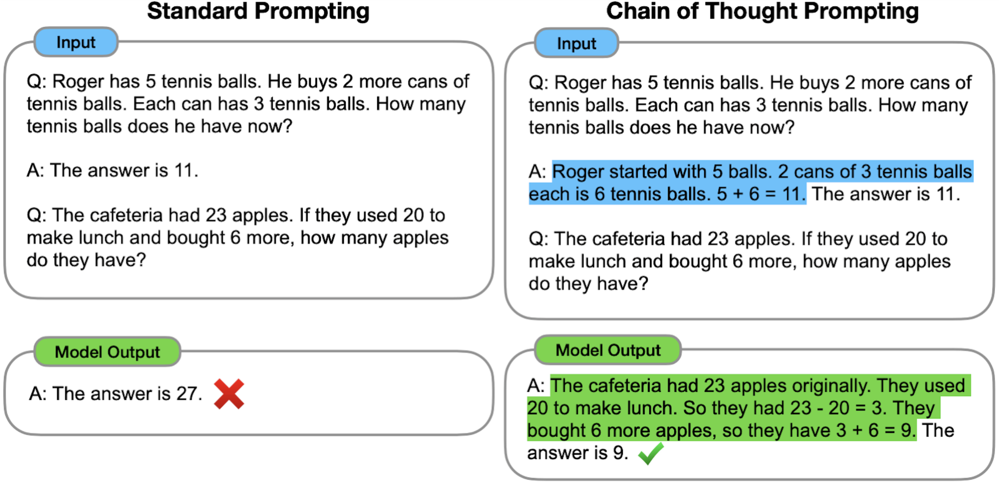

First, let's generate the response without a chain of though prompt.

In [47]:
!pip install -U openai==1.11

  Using cached openai-1.11.0-py3-none-any.whl (226 kB)
  Attempting uninstall: openai
    Found existing installation: openai 0.27.8
    Uninstalling openai-0.27.8:
      Successfully uninstalled openai-0.27.8


In [49]:
from openai import OpenAI
import getpass

OPENAI_API_KEY = getpass.getpass() #input: API KEY

openai.api_key = OPENAI_API_KEY

client = OpenAI(
    api_key=openai.api_key,
)

··········


In [52]:
question = """Q: Roger has 5 tennis balls. He buys 2 more cans of tennis balls.
Each can has 3 tennis balls. How many tennis balls does he have now?
A: The answer is 11.
Q: The cafeteria had 23 apples.
If they used 20 to make lunch and bought 6 more, how many apples do they have?
A:"""

response = client.chat.completions.create(model="gpt-3.5-turbo", messages=[{'role': 'user', 'content': question}])
response.choices[0].message.content

'The cafeteria now has 9 apples.'

Rewriting the prompt "to include a chain of thought" shows the LLM how to decompose the question into multiple simple steps of reasoning.

The model response then follows a similar chain of thought, increasing the likelihood of a correct answer.

In [53]:
question = """Q: Roger has 5 tennis balls. He buys 2 more cans of tennis balls.
Each can has 3 tennis balls. How many tennis balls does he have now?
A: Roger started with 5 balls. 2 cans of 3 tennis balls
each is 6 tennis balls. 5 + 6 = 11. The answer is 11.
Q: The cafeteria had 23 apples.
If they used 20 to make lunch and bought 6 more, how many apples do they have?
A:"""

response = client.chat.completions.create(model="gpt-3.5-turbo", messages=[{'role': 'user', 'content': question}])
response.choices[0].message.content

'They started with 23 apples, used 20 for lunch, and bought 6 more. \n23 - 20 + 6 = 9. The cafeteria now has 9 apples.'

Notice the chain of thought includes both text describing the steps to follow and intermediate outputs/conclusions from each reasoning step.

## Zero-Shot Chain of Thought

Zero-shot CoT prompting is a technique that allows large language models (LLMs) to generate more accurate answers to questions. It does this by appending the words "Let's think step by step." to the end of a question. This simple prompt helps the LLM to generate a chain of thought that answers the question, from which the LLM can then extract a more accurate answer.

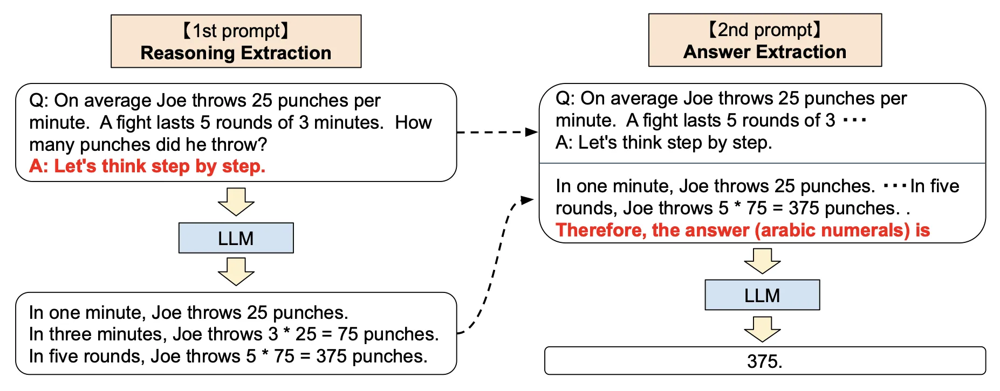

First, let's generate the response without encouraging LLM to think step by step.

In [56]:
# "role": "user" refers to a question, "assistant" refers to a response.
messages = [{"role": "user", "content": "Roger has 5 tennis balls. He buys 2 more cans of tennis balls.\nEach can has 3 tennis balls. How many tennis balls does he have now?"},
            {"role": "assistant", "content": "The answer is 11."},
            {"role": "user", "content": "The cafeteria had 23 apples.\nIf they used 20 to make lunch and bought 6 more, how many apples do they have?"}]

response = openai.chat.completions.create(model="gpt-3.5-turbo", messages=messages)
print(response.choices[0].message.content)

334


Now, let's generate response while "explicitly prompting" LLM to think step by step.

In [55]:
messages = [{"role": "user", "content": "Roger has 5 tennis balls. He buys 2 more cans of tennis balls.\nEach can has 3 tennis balls. How many tennis balls does he have now?"},
            {"role": "assistant", "content": "The answer is 11."},
            {"role": "user", "content": "The cafeteria had 23 apples.\nIf they used 20 to make lunch and bought 6 more, how many apples do they have?"},
            {"role": "assistant", "content": "Let's think step by step."}]

response = openai.chat.completions.create(model="gpt-3.5-turbo", messages=messages)
print(response.choices[0].message.content)

First, if they used 20 apples to make lunch, that means they have 23 - 20 = 3 apples left.
Then, if they bought 6 more apples, they will have 3 + 6 = 9 apples.

Therefore, the cafeteria has 9 apples now.


Here, we found that LLM can generate a more accurate answer if we use zero-shot chain of thought prompting.

## Tree of Thoughts

The "tree-of-thought (https://arxiv.org/abs/2305.10601 https://t.co/IaZZdVeaTW)" approach, in contrast to the "chain-of-thought", involves exploring multiple paths or solutions simultaneously, much like branches on a tree. While chain-of-thought follows a single, linear sequence of reasoning to reach a conclusion, tree-of-thought branches out to consider various possibilities and scenarios at once. This method allows for a more comprehensive examination of potential outcomes, helping to identify the most effective solution among multiple options by comparing different "branches" of thought.

ToT maintains a tree of thoughts, where thoughts represent coherent language sequences that serve as intermediate steps toward solving a problem. This approach enables an LM to self-evaluate the progress through intermediate thoughts made towards solving a problem through a deliberate reasoning process. The LM's ability to generate and evaluate thoughts is then combined with search algorithms (e.g., breadth-first search and depth-first search) to enable systematic exploration of thoughts with lookahead and backtracking.

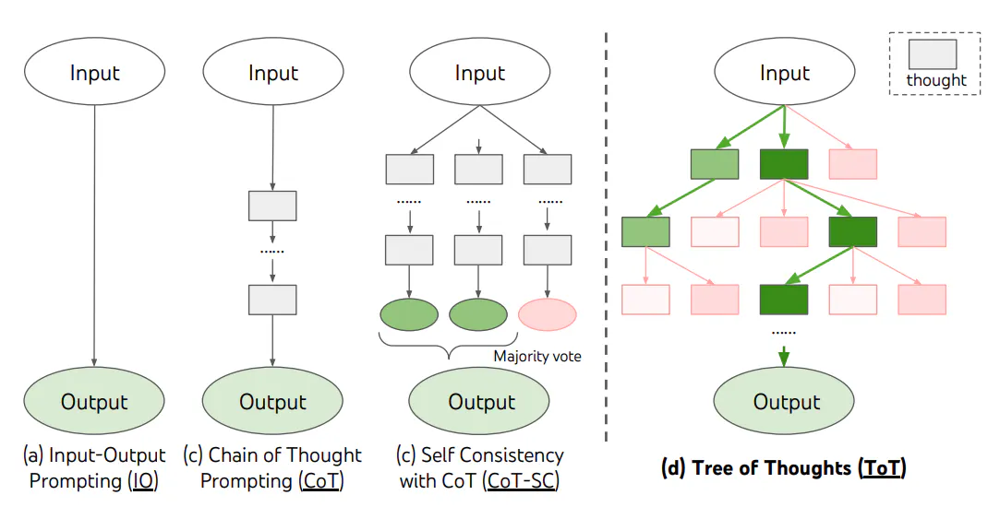

When using ToT, different tasks requires defining the number of candidates and the number of thoughts/steps. For instance, as demonstrated in the paper, Game of 24 is used as a mathematical reasoning task which requires decomposing the thoughts into 3 steps, each involving an intermediate equation. At each step, the best b=5 candidates are kept.

To perform BFS in ToT for the Game of 24 task, the LM is prompted to evaluate each thought candidate as "sure/maybe/impossible" with regard to reaching 24. As stated by the authors, "the aim is to promote correct partial solutions that can be verdicted within few lookahead trials, and eliminate impossible partial solutions based on "too big/small" commonsense, and keep the rest "maybe"". Values are sampled 3 times for each thought. The process is illustrated below:



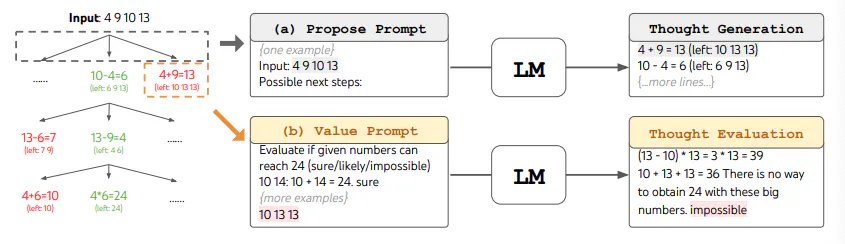

From the results reported in the figure below, ToT substantially outperforms the other prompting methods:

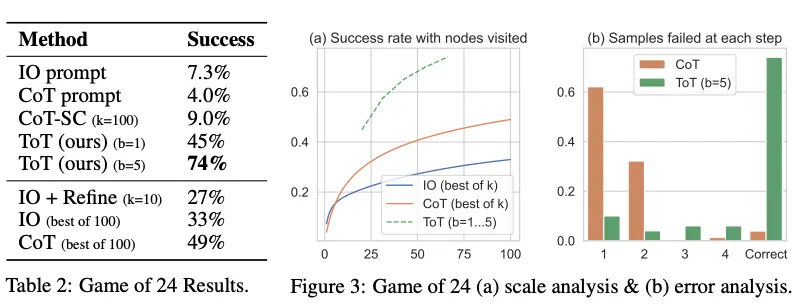

Using a tree-of-thoughts library, let's try to solve the Game of 24!

In [ ]:
!pip install tree-of-thoughts-llm

In [2]:
import openai
import getpass

OPENAI_API_KEY = getpass.getpass() #input: API KEY

··········


In [ ]:
import argparse
from tot.methods.bfs import solve
from tot.tasks.game24 import Game24Task

openai.api_key = OPENAI_API_KEY
args = argparse.Namespace(backend='gpt-3.5-turbo',
                          temperature=0.7, task='game24',
                          naive_run=False, prompt_sample=None,
                          method_generate='propose', method_evaluate='value',
                          method_select='greedy', n_generate_sample=1,
                          n_evaluate_sample=3, n_select_sample=5)

task = Game24Task()
ys, infos = solve(args, task, 900)
print(ys[0]) # the solution!

# Use Cases of LLMS

There are many different tasks for which one could apply LLMs according to the approaches we developed above. We showcase several below:

## - Actor - Critic - Improve Object with Critique

You can set up an "Actor-Critic" model by asking the model to generate text, and then ask it to generate a critique, and to regenerate the text according to the critique. In this way, you are instantiating two different models that seek to adversarially improve one another. Consider the following prompts in sequence:


CODE:
“Write story of up to 300 words in length intended for an native English language speaking child audience that involves two anthropomorphized puppies ‘Bumble’ and ‘Gruff’ who go on adventure.”


“Critique this story regarding its clarity, grammar, consistency, suspense, and surprise. Then rewrite in 300 words accounting for these critiques.”


“Critique this story regarding its clarity, grammar, consistency, suspense, and surprise. Then rewrite in 300 words accounting for these critiques.”

In [5]:
!pip install openai==1.11.0

  Using cached openai-1.11.0-py3-none-any.whl (226 kB)
  Attempting uninstall: openai
    Found existing installation: openai 0.27.7
    Uninstalling openai-0.27.7:
      Successfully uninstalled openai-0.27.7
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tree-of-thoughts-llm 0.1.0 requires openai==0.27.7, but you have openai 1.11.0 which is incompatible.


In [16]:
import getpass

OPENAI_API_KEY = getpass.getpass() #input: API KEY

··········


In [17]:
import openai
from openai import OpenAI

openai.api_key = OPENAI_API_KEY

client = OpenAI(
    api_key=openai.api_key,
)

In [21]:
stories = []

# generate story as an actor
prompt = "Write story of up to 300 words in length intended for an native English language speaking child audience that involves two anthropomorphized puppies ‘Bumble’ and ‘Gruff’ who go on adventure."
response = openai.chat.completions.create(model="gpt-3.5-turbo", messages=[{"role": "user", "content": prompt}])
story = response.choices[0].message.content.strip()
stories.append(story)

# run critique scenario twice
critique_prompt = "Critique this story regarding its clarity, grammar, consistency, suspense, and surprise. Then rewrite in 300 words accounting for these critiques: "
for i in range(1, 3):
    response = openai.chat.completions.create(model="gpt-3.5-turbo", messages=[{"role": "user", "content": critique_prompt + story}])
    story = response.choices[0].message.content.strip()
    stories.append(story)

Here, you can see that stories are improved through the process of actor-critique stages

In [24]:
'Initial story:', stories[0]

('Initial story:',
 'Once upon a time, in a quaint little town called Pawsville, there lived two adorable puppies named Bumble and Gruff. Bumble was a fluffy golden retriever with big, floppy ears, while Gruff was a bouncy border collie with a mischievous twinkle in his eye.\n\nOne sunny morning, Bumble and Gruff decided to go on an adventure. They packed some snacks in a little backpack and set off into the nearby forest. As they trotted along, they came across a sparkling river that whispered secrets of hidden treasures.\n\nWithout thinking twice, Bumble and Gruff dove into the cool, clear water and swam to the other side. On the opposite bank, they found a magical clearing filled with colorful flowers and fluttering butterflies. They danced and played in the meadow, their laughter echoing throughout the forest.\n\nSuddenly, they heard a faint cry for help coming from behind a bush. Curious and brave, Bumble and Gruff rushed to investigate. To their surprise, they found a tiny kitten

In [25]:
'Critique #1:', stories[1]

('Critique #1:',
 'The story is clear in its description of the characters and setting, but it lacks consistency in terms of the level of suspense and surprise. The buildup to the discovery of the kitten in distress is too sudden and lacks enough suspense to keep the reader engaged. Additionally, the resolution of the story is predictable and lacks a surprising twist to make it more memorable.\n\nRewritten story:\n\nIn the charming town of Pawsville, two playful puppies, Bumble and Gruff, resided. Bumble, a fluffy golden retriever, and Gruff, a bouncy border collie, were the best of friends. One sunny morning, they embarked on an exciting adventure into the nearby forest, carrying a little backpack filled with snacks.\n\nAs they strolled through the forest, they stumbled upon a glistening river that seemed to hold secrets of hidden treasures. Without hesitation, Bumble and Gruff leaped into the water and swam to the other side. Across the river, they discovered a magical clearing adorn

In [26]:
'Critique #2:', stories[2]

('Critique #2:',
 "In the charming town of Pawsville lived two playful puppies, Bumble and Gruff. Bumble, a fluffy golden retriever, and Gruff, a bouncy border collie, were the best of friends. Together, they embarked on an exciting adventure one sunny morning, venturing into the nearby forest with a little backpack filled with snacks.\n\nAs they explored, they stumbled upon a glistening river that beckoned to them with hidden treasures. Without hesitation, the puppies plunged into the water, swimming to the other side where they discovered a magical clearing adorned with vibrant flowers and butterflies. Their laughter filled the meadow as they frolicked in the enchanting surroundings.\n\nSuddenly, a faint cry for help caught their attention from behind a bush. Curious, Bumble and Gruff rushed to the bush and found a tiny kitten trapped in thorns, meowing for assistance. With quick thinking and teamwork, Bumble carefully freed the kitten while Gruff gathered healing herbs to tend to it

## Rewriting texts in different ways (e.g German, Politically Sensitive)


“Rewrite the following text ‘This is the best hamburger I have ever tasted.’ in Russian and Chinese.


“Rewrite it as the sentiment might be rendered by a vegetarian”


“Rewrite it in two sentences with specific, concrete language about an eating experience.”


“Rewrite it in the style of Proust.”


“Rewrite it in the style of the following paper abstract: ‘Four score and seven years ago our fathers brought forth on this continent a new nation, conceived in liberty, and dedicated to the proposition that all men are created equal. Now we are engaged in a great civil war, testing whether that nation, or any nation so conceived and so dedicated, can long endure. We are met on a great battlefield of that war. We have come to dedicate a portion of that field as a final resting place for those who here gave their lives that that nation might live. It is altogether fitting and proper that we should do this. But in a larger sense we cannot dedicate, we cannot consecrate, we cannot hallow this ground. The brave men, living and dead, who struggled here have consecrated it, far above our poor power to add or detract. The world will little note, nor long remember, what we say here, but it can never forget what they did here. It is for us the living, rather, to be dedicated here to the unfinished work which they who fought here have thus far so nobly advanced. It is rather for us to be here dedicated to the great task remaining before us,that from these honored dead we take increased devotion to that cause for which they gave the last full measure of devotion, that we here highly resolve that these dead shall not have died in vain, that this nation, under God, shall have a new birth of freedom, and that government of the people, by the people, for the people, shall not perish from the earth.’”





In [ ]:
def generate_text_with_style(text, style):
    """
    This function takes a piece of text and uses OpenAI's GPT-4 to rewrite it in a specified style.

    Args:
    text (str): The original text.
    style (str): The desired style ('german_child' or 'conservative').
    api_key (str): Your OpenAI API key.

    Returns:
    str: The text rewritten in the specified style.
    """
    if style == 'german_child':
        prompt = f"Translate the following text into German as if it was written by a five-year-old child:\n\n{text}"
    elif style == 'conservative':
        prompt = f"Rewrite the following text in a politically conservative style:\n\n{text}"
    else:
        return "Invalid style specified."

    try:
        response = openai.chat.completions.create(
            model="gpt-4",  # Replace with "gpt-4" if you have access
            messages=[{'role': 'user', 'content': prompt}],
            temperature=0.7,
            max_tokens=250
        )
        return response.choices[0].message.content.strip()
    except Exception as e:
        return str(e)

# Example usage
input_text = "This is an example text for style transformation."
style = 'german_child'  # Can be 'german_child' or 'conservative'
print(generate_text_with_style(input_text, style))


# Homework

In this notebook we explore various applications of generative large language models, including GPT and Llama. For the homework, you will be using GPT or Llama to analyse your social scientific textual dataset.

There are a total of 5 standard questions, you will be graded for 3/5. Also, there is one bonus question.

**1)** Try to use the OpenAI API to analyze a small-sized dataset (Remember to monitor API use on your OpenAI account!). The data could involve a sample from the dataset you are preparing for your final project or some others. If it's going be a conventional task like classification, compare and see how it could beat (or be defeated by) other algorithms you have used in previous weeks. If it's a special task that you cannot find a learned algorithm to compare with, evaluate its performance on your own and explore whether you can improve its performance by changing hyperparameters(see here), the prompt, etc.

**2)** Fine-tune an LLM. You can either use the model (llama-2-7b) in the example code or find another open-source LLM. You may use datasets provided by HuggingFace or a dataset you collect from somewhere else (e.g., for your final project). If the task happens to be the same as in exercise 1, compare the performance between the OpenAI LLM and your fine-tuned LLM. Also compare the performance between the "vanilla" un-tuned and the fine-tuned LLM.

**3)** Use LLM to generate some data and compare the differences between model-generated data and actual data (e.g., human data). This exercise should not be a repetition of exercise 1. Focus more on analyzing language nuances, qualitatively or quantitatively. You should also notice how the choice of LLM has possibly impacted the language it uses.

**4)** Compare how LLMs change their performance with different shots on your task. If the evalution criterion is quantifiable, such as classification with ground truth labels, plot how accuracy changes. If the evalution criterion cannot be easily quantified, such as the clarity of explaining a concept, use your imagination to do some comparsion (for exmaple, you can ask another LLM to rate its peer :)) Desribe the differences in cells that follow. If you find close-sourced LLM APIs pricy and are unsatisfied with responses from small-sized open-sourced LLMs, you can try large-sized LLMs (such as 70B version Llama-2) with Petals (https://colab.research.google.com/drive/1uCphNY7gfAUkdDrTx21dZZwCOUDCMPw8?usp=sharing).

**5)** Use an Actor - Critic design to improve LLM's performance on your task or perform some related experiments with language prediction. For example, you might want to investigate how LLMs can more or less effectiveloy predict how different groups of people might respond to a prompt or question (e.g., write a dating profile; answer a survey question).

**Bonus 1)** Use either chain of thoughts (CoT) or tree of thoughts (ToT) to improve LLM's performance on your task or perform some related experiments with language prediction.